# Librairies

In [1]:
import scipy
scipy.__version__

'1.7.3'

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import nibabel as nib
import os
import cv2
import graphviz 
import ipywidgets as widgets
import sklearn
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, LeaveOneOut
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.svm import SVC, LinearSVC


import itertools
def plot_confusion_matrix(cm, classes,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=75)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

In [2]:
# Versions of the libraries
print('Numpy version: {}'.format(np.__version__))
print('Pandas version: {}'.format(pd.__version__))
print('Seaborn version: {}'.format(sns.__version__))
print('Nibabel version: {}'.format(nib.__version__))
print('OpenCV version: {}'.format(cv2.__version__))
print('Scikit-Learn version: {}'.format(sklearn.__version__))

Numpy version: 1.22.1
Pandas version: 1.4.4
Seaborn version: 0.12.2
Nibabel version: 5.0.1
OpenCV version: 4.6.0
Scikit-Learn version: 1.2.1


# I - Data

In [3]:
# Sources folders and files

train_folder = "./Train"
test_folder = "./Test"

meta_data_test = pd.read_csv('metaDataTest.csv')
meta_data_train = pd.read_csv('metaDataTrain.csv')

In [4]:
# Target labels
y = np.array(meta_data_train['Category'])

In [5]:
# We store the images and metadata in a dictionnary
train_data = {}

i=0
for d in os.listdir(train_folder):
    path = os.path.join(train_folder, d)

    im_d = os.path.join(path, "{}_ED.nii".format(d))
    seg_d = os.path.join(path, "{}_ED_seg.nii".format(d))
    im_s = os.path.join(path, "{}_ES.nii".format(d))
    seg_s = os.path.join(path, "{}_ES_seg.nii".format(d))
    
    train_data[i] = {"im_d": np.array(nib.load(im_d).get_fdata()),
                     "seg_d": np.array(nib.load(seg_d).get_fdata()),
                     "im_s": np.array(nib.load(im_s).get_fdata()),
                     "seg_s": np.array(nib.load(seg_s).get_fdata()),
                     "height": meta_data_train['Height'][i],
                     "weight": meta_data_train['Weight'][i],
                     "scale_xy": nib.load(im_d).header['pixdim'][1],
                     "scale_z": nib.load(im_d).header['pixdim'][3]}
    
    i+=1

In [6]:
# Same thing for the test images
test_data = {}

i=0
for d in os.listdir(test_folder):
    path = os.path.join(test_folder, d)

    im_d = os.path.join(path, "{}_ED.nii".format(d))
    seg_d = os.path.join(path, "{}_ED_seg.nii".format(d))
    im_s = os.path.join(path, "{}_ES.nii".format(d))
    seg_s = os.path.join(path, "{}_ES_seg.nii".format(d))
    
    test_data[i] = {"im_d": np.array(nib.load(im_d).get_fdata()),
                    "seg_d": np.array(nib.load(seg_d).get_fdata()),
                    "im_s": np.array(nib.load(im_s).get_fdata()),
                    "seg_s": np.array(nib.load(seg_s).get_fdata()),
                    "height": meta_data_test['Height'][i],
                    "weight": meta_data_test['Weight'][i],
                    "scale_xy": nib.load(im_d).header['pixdim'][1],
                    "scale_z": nib.load(im_d).header['pixdim'][3]}
    
    i+=1

Slice 5 from Patient 12 in class 2: 
Height = 175.0 cm
Weight = 57.0 kg


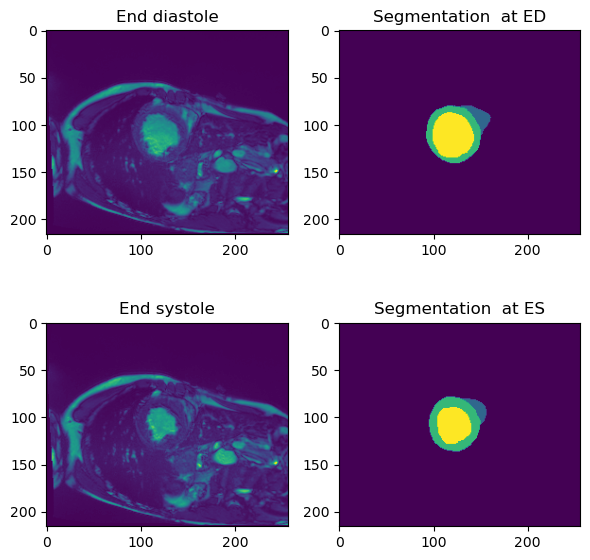

In [7]:
# Visualisation of the data
slice_id = 5
patient_id = 12
print("Slice {} from Patient {} in class {}: ".format(slice_id, patient_id, y[patient_id]))
print("Height = {} cm".format(train_data[12]['height']))
print('Weight = {} kg'.format(train_data[12]['weight']))

plt.figure(figsize=(6,6))
plt.subplot(2,2,1)
plt.imshow(train_data[12]['im_d'][:,:,5])
plt.title('End diastole')
plt.subplot(2,2,2)
plt.imshow(train_data[12]['seg_d'][:,:,5])
plt.title('Segmentation  at ED')
plt.subplot(2,2,3)
plt.imshow(train_data[12]['im_s'][:,:,5])
plt.title('End systole')
plt.subplot(2,2,4)
plt.imshow(train_data[12]['seg_s'][:,:,5])
plt.title('Segmentation  at ES')
plt.tight_layout()
plt.show()

# II - Features extraction

In [8]:
# Masks to isolate each part of the segmentation
def get_mask(seg, label):
    mask = np.zeros_like(seg)
    mask[seg==label] = 1
    return mask

def right_ventricule_mask(seg):
    return get_mask(seg, 1)

def myocardium_mask(seg):
    return get_mask(seg, 2)

def left_ventricule_mask(seg):
    return get_mask(seg, 3)

In [9]:
# Volume of a segmentation over an ensemble of slices
def volume(seg_slices, mask, scale_xy, scale_z):
    n, m, p = seg_slices.shape
    V = 0
    for k in range(p):
        slice_mask = mask(seg_slices[:,:,k])
        V += np.sum(slice_mask)*scale_z*scale_xy**2
    return V

# Ejection fraction from volumes at ED and ES
def ejection_fraction(Vd, Vs):
    return (Vd-Vs)/Vd

# Body Surface Area to normalize volumes
def body_surface_area(height, weight):
    return 0.007184*(weight**0.425)*(height**0.725)

In [10]:
# Features of the train set

n = len(train_data)

height = np.array([train_data[k]["height"] for k in range(n)])
weight = np.array([train_data[k]["weight"] for k in range(n)])
BSA = body_surface_area(height, weight)


# Left ventricle
left_Vd = np.array([volume(train_data[k]["seg_d"], 
                           left_ventricule_mask, 
                           train_data[k]["scale_xy"], 
                           train_data[k]["scale_z"]) for k in range(n)])/BSA

left_Vs = np.array([volume(train_data[k]["seg_s"], 
                           left_ventricule_mask, 
                           train_data[k]["scale_xy"], 
                           train_data[k]["scale_z"]) for k in range(n)])/BSA

left_ef = ejection_fraction(left_Vd, left_Vs)


# Right ventricle
right_Vd = np.array([volume(train_data[k]["seg_d"], 
                            right_ventricule_mask, 
                            train_data[k]["scale_xy"], 
                            train_data[k]["scale_z"]) for k in range(n)])/BSA

right_Vs = np.array([volume(train_data[k]["seg_s"], 
                            right_ventricule_mask, 
                            train_data[k]["scale_xy"], 
                            train_data[k]["scale_z"]) for k in range(n)])/BSA

right_ef = ejection_fraction(right_Vd, right_Vs)


# Myocardium
myo_Vd = np.array([volume(train_data[k]["seg_d"], 
                          myocardium_mask, 
                          train_data[k]["scale_xy"], 
                          train_data[k]["scale_z"]) for k in range(n)])/BSA

myo_Vs = np.array([volume(train_data[k]["seg_s"], 
                          myocardium_mask, 
                          train_data[k]["scale_xy"], 
                          train_data[k]["scale_z"]) for k in range(n)])/BSA


# Ratios between volumes
ratio_RL_d = right_Vd/left_Vd
ratio_RL_s = right_Vs/left_Vs
ratio_ML_d = myo_Vd/left_Vd
ratio_ML_s = myo_Vs/left_Vs

In [11]:
# We store them as a Dataframe
X = pd.DataFrame({"Height": height,
                  "Weight": weight,
                  "LV Volume at ED": left_Vd,
                  "LV Volume at ES": left_Vs,
                  "RV Volume at ED": right_Vd,
                  "RV Volume at ES": right_Vs,
                  "MYO Volume at ED": myo_Vd,
                  "MYO Volume at ES": myo_Vs,
                  "LV Ejection Fraction": left_ef,
                  "RV Ejection Fraction": right_ef,
                  "RV and LV Volumes ratio at ED": ratio_RL_d,
                  "RV and LV Volumes ratio at ES": ratio_RL_s,
                  "MYO and LV Volumes ratio at ED": ratio_ML_d,
                  "MYO and LV Volumes ratio at ES": ratio_ML_s,})

X

,Height,Weight,LV Volume at ED,LV Volume at ES,RV Volume at ED,RV Volume at ES,MYO Volume at ED,MYO Volume at ES,LV Ejection Fraction,RV Ejection Fraction,RV and LV Volumes ratio at ED,RV and LV Volumes ratio at ES,MYO and LV Volumes ratio at ED,MYO and LV Volumes ratio at ES
0,184.0,95.0,135418.247604,103387.312137,64028.307257,27287.269159,75272.138952,89391.258952,0.236533,0.573825,0.472819,0.263932,0.555849,0.864625
1,160.0,70.0,153441.962140,108727.180601,54525.483065,16642.576185,92635.039815,111187.950620,0.291412,0.694774,0.355349,0.153067,0.603714,1.022633
2,165.0,77.0,150045.342405,130730.347295,104293.030480,94668.629216,104028.260157,109032.419273,0.128728,0.092282,0.695077,0.724152,0.693312,0.834025
3,159.0,46.0,180856.733073,157023.301892,73677.572735,58618.058308,116795.476779,121305.555110,0.131781,0.204398,0.407381,0.373308,0.645790,0.772532
4,165.0,77.0,157684.628167,121515.280951,92433.967685,40426.456864,109205.049524,125943.961770,0.229378,0.562645,0.586195,0.332686,0.692554,1.036445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,186.0,76.0,76116.651427,37446.136932,142020.720055,108820.979297,58472.875322,57517.436183,0.508043,0.233767,1.865830,2.906067,0.768201,1.536005
96,187.0,82.0,59969.684352,23945.379722,100689.578084,62243.114370,45086.154188,53202.511822,0.600709,0.381832,1.679008,2.599379,0.751816,2.221828
97,167.0,50.0,60604.843878,26599.128948,106335.971492,104297.646740,60463.573845,65983.195824,0.561106,0.019169,1.754579,3.921093,0.997669,2.480653
98,180.0,80.0,70326.402411,37095.859550,100362.468668,68441.661215,46375.814081,46200.117868,0.472519,0.318055,1.427095,1.844995,0.659437,1.245425


# III - Features analysis
## Features visualization

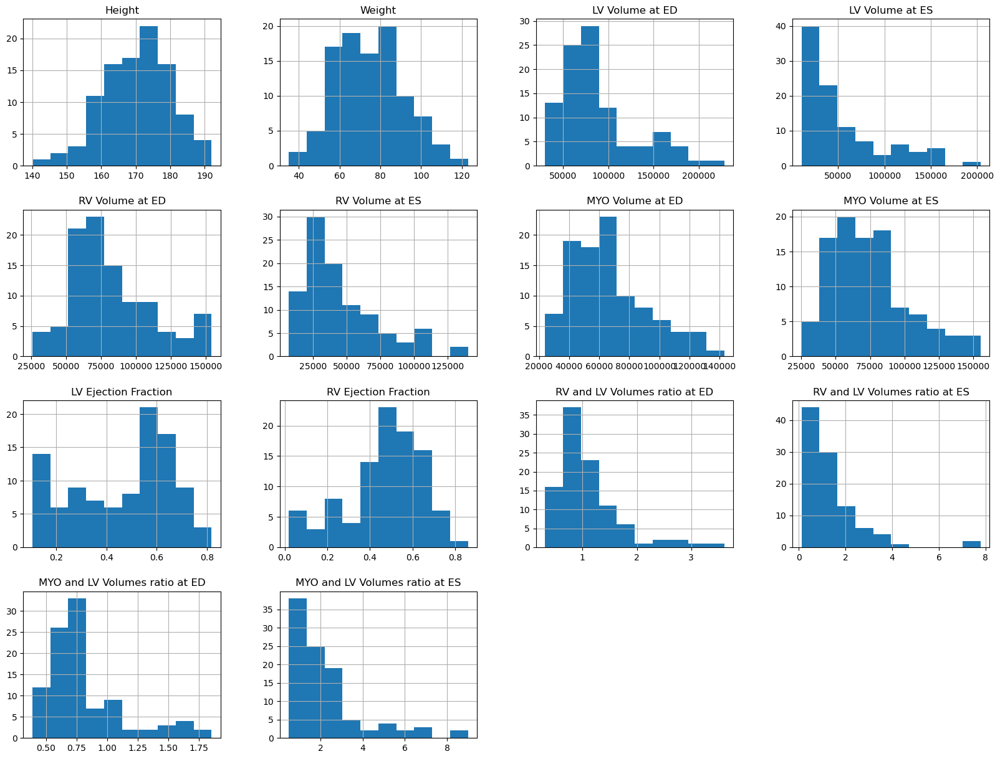

In [12]:
# Distributions

X.hist(figsize=(20,15))
plt.show()

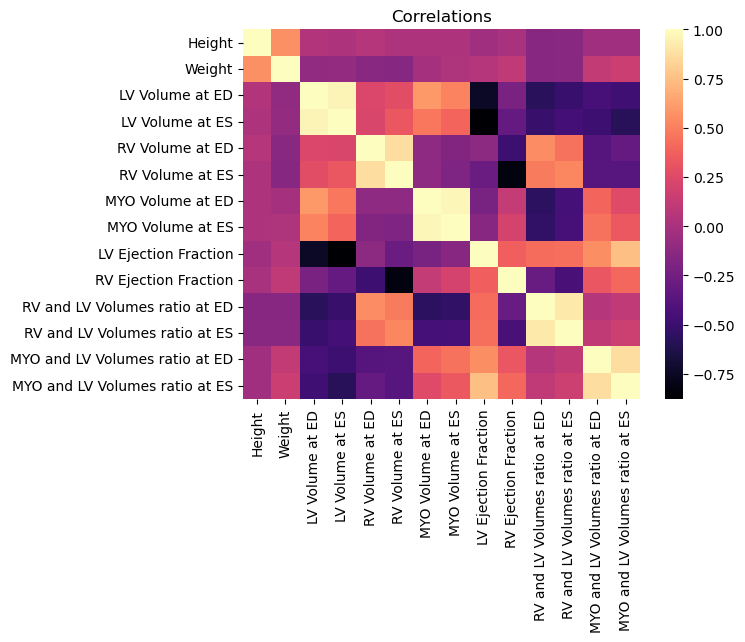

In [13]:
# Correlations

sns.heatmap(X.corr(), cmap = 'magma')
plt.title("Correlations")
plt.show()

In [14]:
# Interactive plots of 2 features against each other
# Dots are in the color of the samples' classes
def plot_correlation(feature_x, feature_y):
    plt.figure()
    plt.scatter(X[feature_x], X[feature_y], alpha=0.7, c=y)
    #plt.scatter(data[:, feature1], data[:, feature2], c=labels, cmap=plt.colors.ListedColormap(colors))
    plt.xlabel(f'{feature_x}')
    plt.ylabel(f'{feature_y}')
    plt.colorbar()
    plt.grid()
    plt.show()

    

feature_x = widgets.Select(options=X.columns)
feature_y = widgets.Select(options=X.columns, index=1)
ui = widgets.HBox([feature_x, feature_y])
    
interact_widget = widgets.interactive_output(plot_correlation,
                                    {'feature_x': feature_x,
                                    'feature_y': feature_y})


display(ui, interact_widget)

Output()

## First classifiers and features importance

In [15]:
class_names = ["Healthy controls",
    "Myocardial infarction",
    "Dilated cardiomyopathy",
    "Hypertrophic cardiomyopathy",
    "Abnormal right ventricle"]

### Decision tree

In [16]:
# Grid search to find optimal parameters for the model
Tree = DecisionTreeClassifier(random_state=0)

p_grid_tree = {'min_samples_leaf': range(1,16), 'min_samples_split': range(2,16)} 
grid_tree = GridSearchCV(Tree, p_grid_tree, cv=5, n_jobs=-1)
grid_tree.fit(X, y)


print("Best validation score: {}".format(grid_tree.best_score_))
print("Best params: {}".format(grid_tree.best_params_))

best_params=grid_tree.best_params_

Best validation score: 0.82
Best params: {'min_samples_leaf': 4, 'min_samples_split': 9}


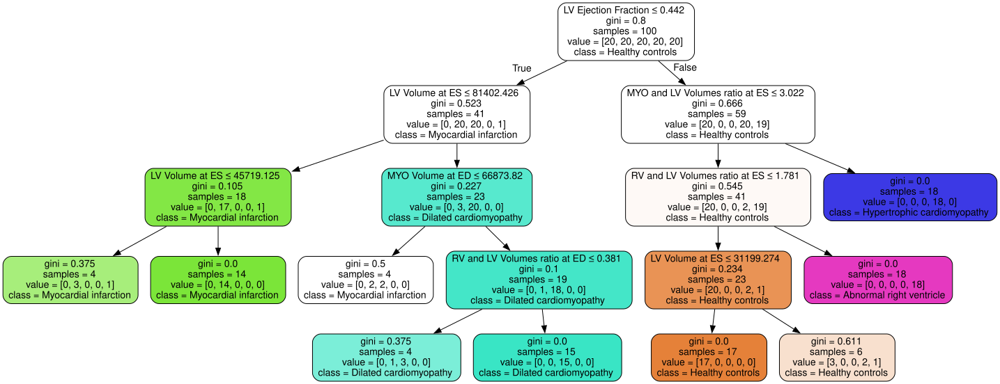

In [17]:
# Visualisation of the Decision tree
Tree = DecisionTreeClassifier(min_samples_leaf=best_params['min_samples_leaf'], 
                              min_samples_split=best_params['min_samples_split'],
                              random_state=0)

Tree.fit(X, y)
dot_data = sklearn.tree.export_graphviz(Tree, out_file=None,feature_names=X.columns,class_names=class_names,filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
graph.format = 'png'
graph.render('tree')
graph

### Random forest

In [18]:
# Grid search to find optimal parameters for the model
RF=RandomForestClassifier(random_state=0)
p_grid_RF = {'n_estimators': [50,100,500], 'max_features': ['sqrt','log2']}   

grid_RF = GridSearchCV(estimator=RF, param_grid=p_grid_RF, scoring='accuracy', cv=5)
grid_RF.fit(X, y)

print("Best validation score: {}".format(grid_RF.best_score_))
print("Best params: {}".format(grid_RF.best_params_))

best_params=grid_RF.best_params_

Best validation score: 0.9199999999999999
Best params: {'max_features': 'sqrt', 'n_estimators': 50}


Feature ranking:
1. Feature 3 representing LV Volume at ES (0.153645)
2. Feature 11 representing RV and LV Volumes ratio at ES (0.119265)
3. Feature 8 representing LV Ejection Fraction (0.118564)
4. Feature 10 representing RV and LV Volumes ratio at ED (0.117171)
5. Feature 13 representing MYO and LV Volumes ratio at ES (0.103105)
6. Feature 2 representing LV Volume at ED (0.075727)
7. Feature 12 representing MYO and LV Volumes ratio at ED (0.069549)
8. Feature 9 representing RV Ejection Fraction (0.065073)
9. Feature 5 representing RV Volume at ES (0.049786)
10. Feature 7 representing MYO Volume at ES (0.048601)
11. Feature 6 representing MYO Volume at ED (0.041553)
12. Feature 4 representing RV Volume at ED (0.024184)
13. Feature 1 representing Weight (0.007020)
14. Feature 0 representing Height (0.006756)


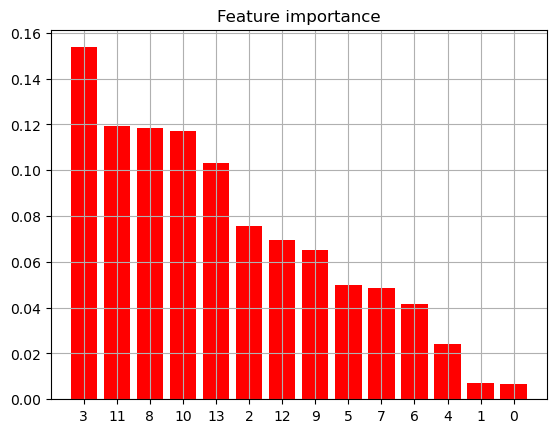

In [19]:
# Visualisation of the features importances
RF = RandomForestClassifier(max_features="sqrt",n_estimators=50, random_state=0)
RF.fit(X,y)

importances = RF.feature_importances_
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(len(importances)):
    print("%d. Feature %d representing %s (%f)" % (f + 1, indices[f], X.columns[indices[f]], importances[indices[f]]))

# Plot the feature importances of the forest
plt.figure()
plt.grid()
plt.title("Feature importance")
plt.bar(range(len(importances)), importances[indices], color="r", align="center")
plt.xticks(range(len(importances)), indices)
plt.xlim([-1, len(importances)])
plt.show()

### Dropping unimportant features

In [20]:
X_lessFeatures = X.drop(['Height', 'Weight'], axis=1)

### Standardize features

In [21]:
scaler = StandardScaler()
X_std = scaler.fit_transform(X_lessFeatures)

# IV - Left Ventricule segmentation

In [22]:
def LV_segmentation(seg):
    # Image of the myocardium segmentation
    myo = myocardium_mask(seg).astype(np.uint8).copy()
    out = np.zeros_like(myo)
    
    # Find the contours and fill the inside one
    # We assume that the myocardium has two circular contours, one outside and one inside
    contours, hierarchy = cv2.findContours(myo, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(out, contours, 0, 1, -1)
    
    out[np.where(myo==1)] = 0
    
    return out

### Training data

In [23]:
# List of the segmentation images in train_data
# And list of the left ventricule segmentations which are the targets
train_segs = []
train_targets = []
for k in range(len(train_data)):
    
    for j in range(train_data[k]['im_d'].shape[2]):
        train_segs.append(train_data[k]['seg_d'][:,:,j])
        train_targets.append(left_ventricule_mask(train_data[k]['seg_d'][:,:,j]))
        
    for i in range(train_data[k]['im_s'].shape[2]):
        train_segs.append(train_data[k]['seg_s'][:,:,i])
        train_targets.append(left_ventricule_mask(train_data[k]['seg_s'][:,:,i]))

# List of the predicted LV segmentations
# Based on the existing Myocardium segmentations
pred_segs = [LV_segmentation(seg) for seg in train_segs]

In [24]:
# Evaluation with DICE coefficient
dice_scores = []

def dice_coefficient(target_segmentation, predicted_segmentation):
    intersection = np.sum(target_segmentation * predicted_segmentation)
    union = np.sum(target_segmentation) + np.sum(predicted_segmentation)
    return (2 * intersection + 1e-7) / (union + 1e-7)

# Compute DICE coefficient for each segmentation image
dice_scores = []
for i in range(len(pred_segs)):
    dice = dice_coefficient(train_targets[i], pred_segs[i])
    dice_scores.append(dice)

# Compute average DICE coefficient
avg_dice = np.mean(dice_scores)
avg_dice

0.9963196635127678

In [25]:
# Errors
np.where(np.array(dice_scores)<1)

(array([ 202,  536,  848, 1249, 1263, 1544, 1807], dtype=int64),)

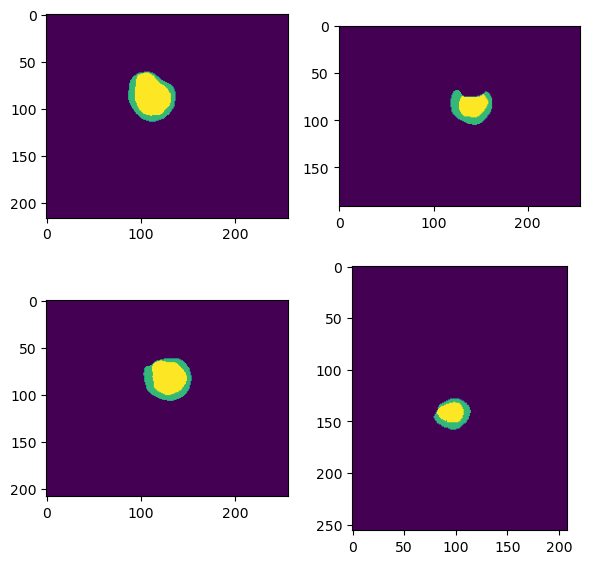

In [26]:
# Visualisation of the errors
plt.figure(figsize=(6,6))
plt.subplot(2,2,1)
plt.imshow(train_segs[202])
plt.subplot(2,2,2)
plt.imshow(train_segs[536])
plt.subplot(2,2,3)
plt.imshow(train_segs[848])
plt.subplot(2,2,4)
plt.imshow(train_segs[1249])
plt.tight_layout()
plt.show()

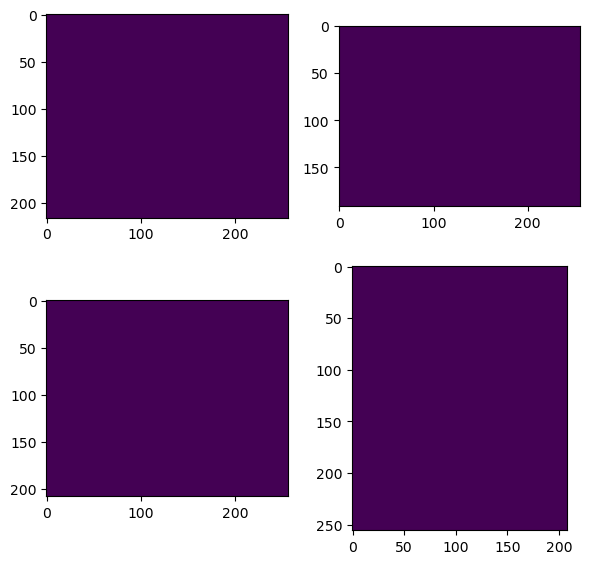

In [27]:
# Result of the errors
# We obtain full black images when the myocardium is open
plt.figure(figsize=(6,6))
plt.subplot(2,2,1)
plt.imshow(pred_segs[202])
plt.subplot(2,2,2)
plt.imshow(pred_segs[536])
plt.subplot(2,2,3)
plt.imshow(pred_segs[848])
plt.subplot(2,2,4)
plt.imshow(pred_segs[1249])
plt.tight_layout()
plt.show()

### Test data

In [28]:
# Segementation of the LV for the test images
# We directly add the result onto the existing segmentation
for k in range(len(test_data)):
    for j in range(test_data[k]['seg_s'].shape[2]):
        test_data[k]['seg_s'][:,:,j] += 3*LV_segmentation(test_data[k]['seg_s'][:,:,j])
    for j in range(test_data[k]['seg_d'].shape[2]):
        test_data[k]['seg_d'][:,:,j] += 3*LV_segmentation(test_data[k]['seg_d'][:,:,j])

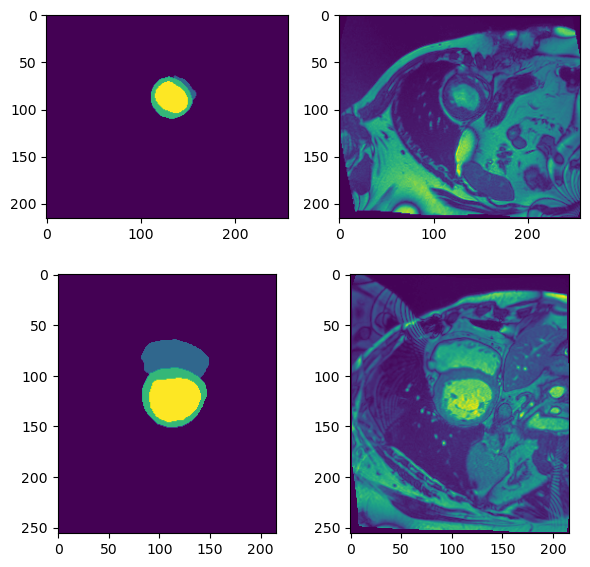

In [29]:
# Visualisation of the results
plt.figure(figsize=(6,6))
plt.subplot(2,2,1)
plt.imshow(test_data[5]['seg_s'][:,:,6])
plt.subplot(2,2,2)
plt.imshow(test_data[5]['im_s'][:,:,6])
plt.subplot(2,2,3)
plt.imshow(test_data[42]['seg_d'][:,:,2])
plt.subplot(2,2,4)
plt.imshow(test_data[42]['im_d'][:,:,2])
plt.tight_layout()
plt.show()

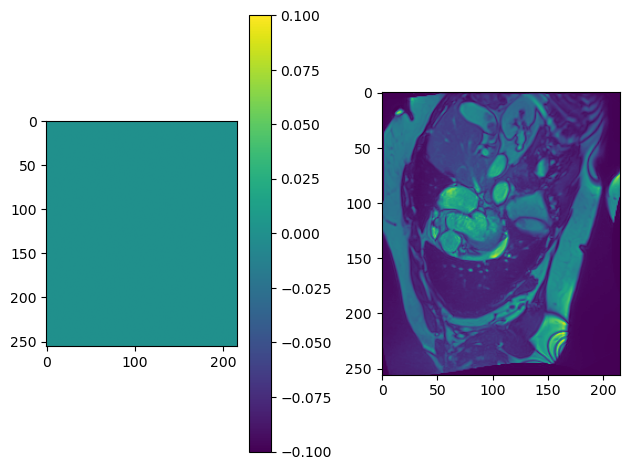

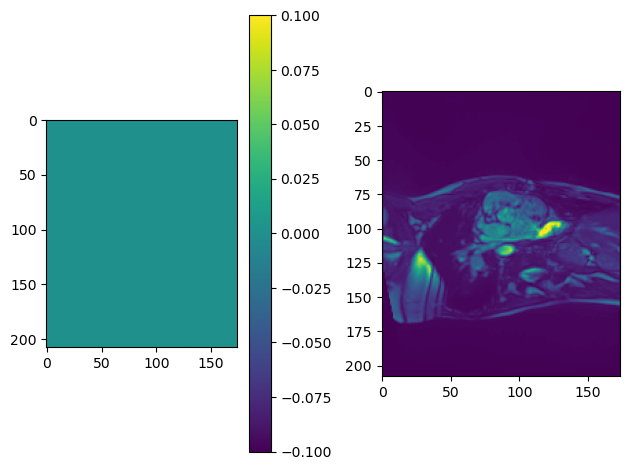

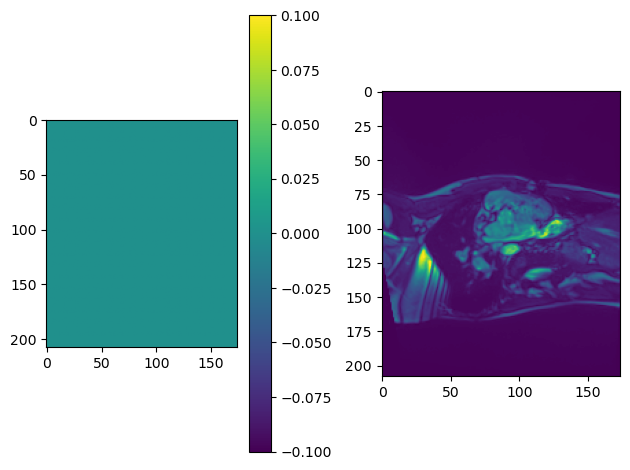

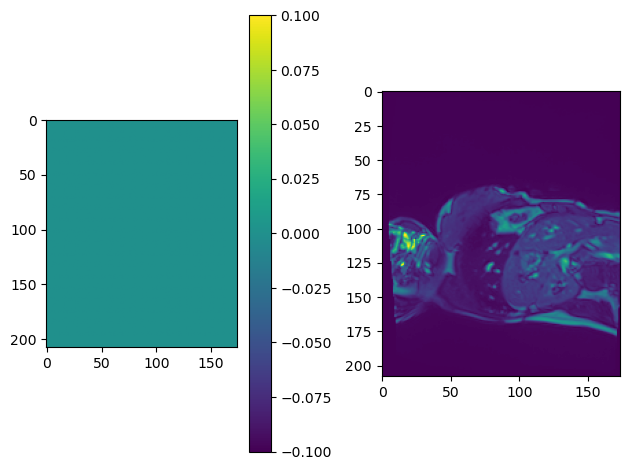

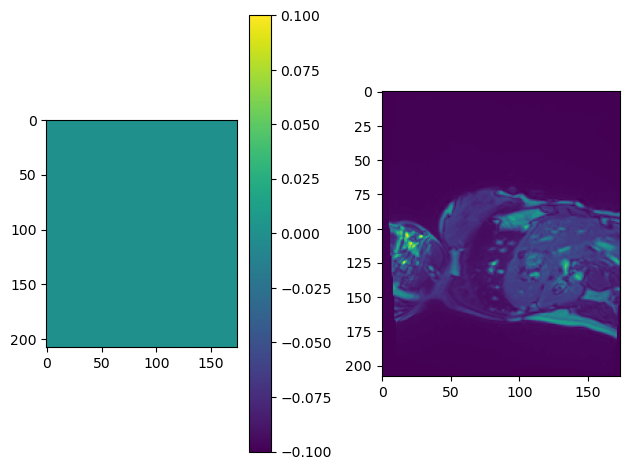

...

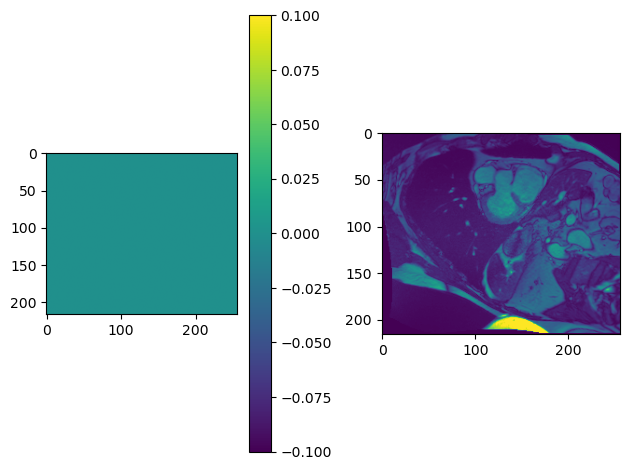

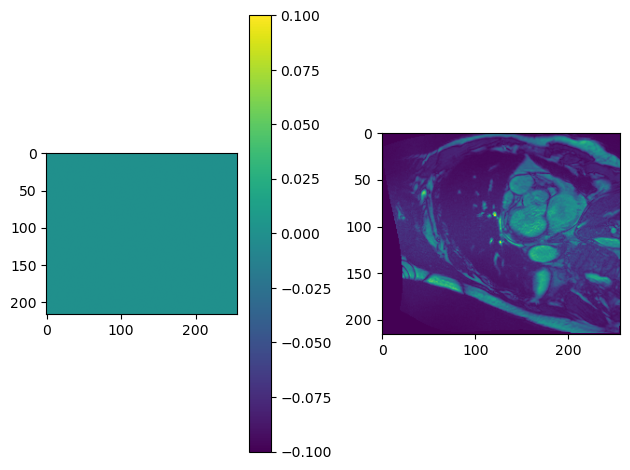

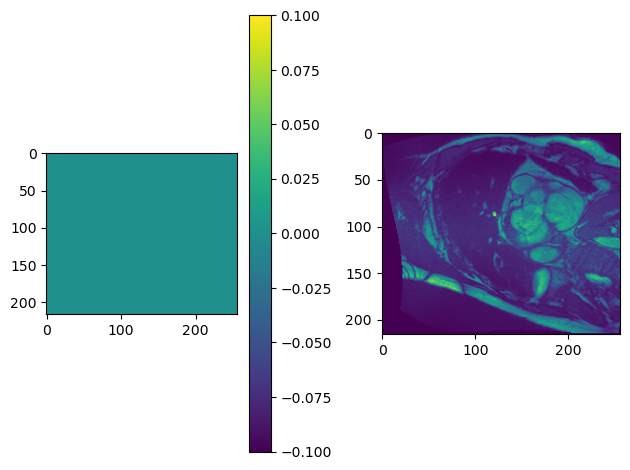

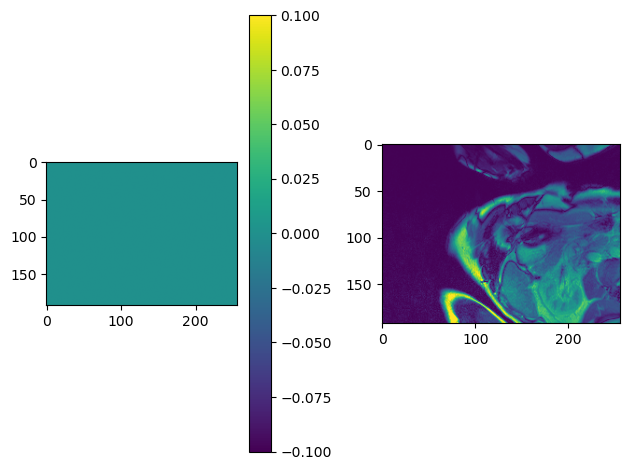

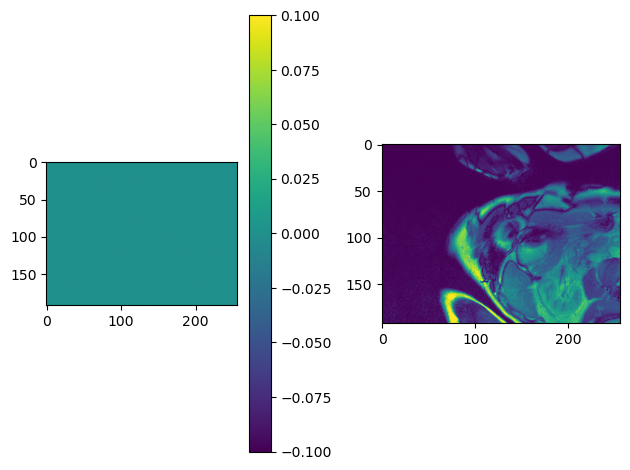

In [30]:
# Potential errors: we visualize all images where the results was full black
# Myocardium is 2
for k in range(len(test_data)):
    for j in range(test_data[k]['seg_s'].shape[2]):
        if np.max(left_ventricule_mask(test_data[k]['seg_s'][:,:,j]))==0:
            plt.subplot(1,2,1)
            plt.imshow(test_data[k]['seg_s'][:,:,j])
            plt.colorbar()
            plt.subplot(1,2,2)
            plt.imshow(test_data[k]['im_s'][:,:,j])
            plt.tight_layout()
            plt.show()
    for j in range(test_data[k]['seg_d'].shape[2]):
        if np.max(left_ventricule_mask(test_data[k]['seg_d'][:,:,j]))==0:
            plt.subplot(1,2,1)
            plt.imshow(test_data[k]['seg_d'][:,:,j])
            plt.colorbar()
            plt.subplot(1,2,2)
            plt.imshow(test_data[k]['im_d'][:,:,j])
            plt.tight_layout()
            plt.show()

# V - Model selection

### Linear classifier
##### Parameters selection

In [31]:
# Grid search to find optimal parameters for the model
Lsvm = LinearSVC(random_state=0, max_iter=10000)
p_grid_lsvm = {'C': np.linspace(0.01,10,100)}   

grid_lsvm = GridSearchCV(estimator=Lsvm, param_grid=p_grid_lsvm, scoring='accuracy', cv=LeaveOneOut())
grid_lsvm.fit(X_std, y)

print("Best validation score: {}".format(grid_lsvm.best_score_))
print("Best params: {}".format(grid_lsvm.best_params_))

Best validation score: 0.91
Best params: {'C': 0.41363636363636364}


##### Evaluation

In [32]:
# Evaluation with cross-validation to obtain more detailed scores
Lsvm = LinearSVC(random_state=0, max_iter=10000, C=0.41)
LSVM_cv = cross_validate(Lsvm, X_std, y,cv=LeaveOneOut(),scoring='accuracy',return_train_score=True)

print("Train CV accuracy : {:.4f} +- {:.4f}".format(LSVM_cv['train_score'].mean(), LSVM_cv['train_score'].std()))
print("Test CV accuracy : {:.4f} +- {:.4f}".format(LSVM_cv['test_score'].mean(), LSVM_cv['test_score'].std()))
print("Training time: {:.4f} +- {:.4f}".format(LSVM_cv['fit_time'].mean(), LSVM_cv['fit_time'].std()))
print("Prediction time: {:.4f} +- {:.4f}".format(LSVM_cv['score_time'].mean(), LSVM_cv['score_time'].std()))

Train CV accuracy : 0.9410 +- 0.0042
Test CV accuracy : 0.9100 +- 0.2862
Training time: 0.0017 +- 0.0005
Prediction time: 0.0003 +- 0.0004


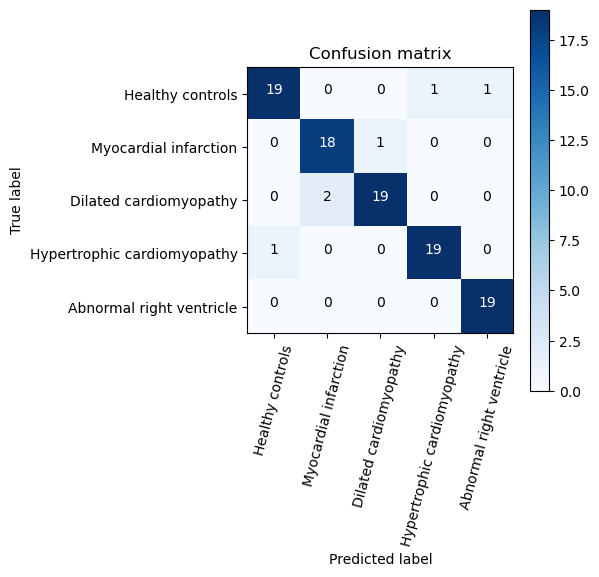

In [33]:
# Confusion matrix
cnf_matrix = confusion_matrix(grid_lsvm.predict(X_std), y)
plt.figure(figsize=(6,6))
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix')
plt.show()

### SVM
##### Parameters selection

In [34]:
# First global grid-search
svm = SVC(random_state=0)
p_grid_svm = {'C': [1e-3,1e-2,1e-1,1,5,1e1], 
              'gamma': [0.0001, 0.0005, 0.001, 0.005, 0.01, 0.1],
              'kernel': ['rbf', 'poly', 'sigmoid'],
              'degree': [2,3,4]}   

grid_svm = GridSearchCV(estimator=svm, param_grid=p_grid_svm, scoring='accuracy', cv=5)
grid_svm.fit(X_std, y)

print("Best validation score: {}".format(grid_svm.best_score_))
print("Best params: {}".format(grid_svm.best_params_))

Best validation score: 0.96
Best params: {'C': 10.0, 'degree': 2, 'gamma': 0.1, 'kernel': 'sigmoid'}


In [35]:
# Second more precise grid-search
svm = SVC(random_state=0, kernel='sigmoid')
p_grid_svm = {'C': np.linspace(7,14,15), 
              'gamma': np.linspace(0.05,0.2,4)}   

grid_svm = GridSearchCV(estimator=svm, param_grid=p_grid_svm, scoring='accuracy', cv=LeaveOneOut())
grid_svm.fit(X_std, y)

print("Best validation score: {}".format(grid_svm.best_score_))
print("Best params: {}".format(grid_svm.best_params_))

Best validation score: 0.97
Best params: {'C': 11.5, 'gamma': 0.1}


##### Evaluation

In [36]:
# Evaluation with cross-validation to obtain more detailed scores
svm = SVC(random_state=0, kernel='sigmoid', C=11.5, gamma=0.1)
SVM_cv = cross_validate(svm, X_std, y,cv=LeaveOneOut(),scoring='accuracy',return_train_score=True)

print("Train CV accuracy : {:.4f} +- {:.4f}".format(SVM_cv['train_score'].mean(), SVM_cv['train_score'].std()))
print("Test CV accuracy : {:.4f} +- {:.4f}".format(SVM_cv['test_score'].mean(), SVM_cv['test_score'].std()))
print("Training time: {:.4f} +- {:.4f}".format(SVM_cv['fit_time'].mean(), SVM_cv['fit_time'].std()))
print("Prediction time: {:.4f} +- {:.4f}".format(SVM_cv['score_time'].mean(), SVM_cv['score_time'].std()))

Train CV accuracy : 0.9788 +- 0.0063
Test CV accuracy : 0.9700 +- 0.1706
Training time: 0.0011 +- 0.0003
Prediction time: 0.0003 +- 0.0004


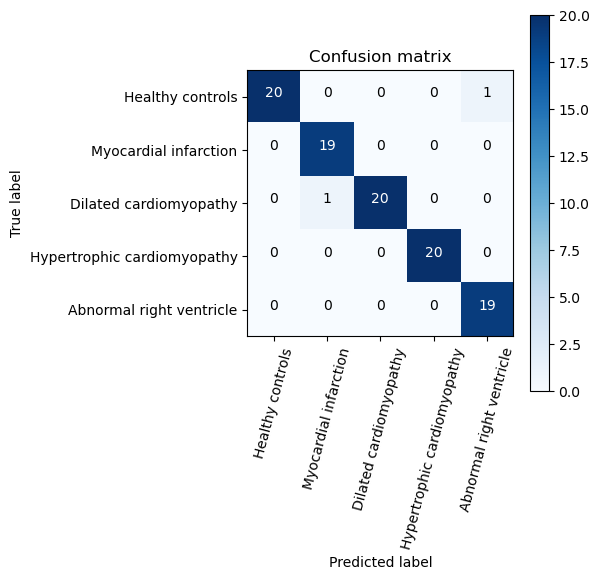

In [37]:
# Confusion matrix
cnf_matrix = confusion_matrix(grid_svm.predict(X_std), y)
plt.figure(figsize=(6,6))
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix')
plt.show()

### Ensemble methods
#### Bagging
##### Parameters selection

In [38]:
# First global grid-search
Bg=BaggingClassifier(random_state=0)
p_grid_Bg = {'n_estimators': [50, 100, 500], 'max_features': [0.25, 0.5, 1.0], 'max_samples': [0.25, 0.5, 1.0]}   

grid_Bg = GridSearchCV(estimator=Bg, param_grid=p_grid_Bg, scoring='accuracy', cv=5)
grid_Bg.fit(X_std, y)

print("Best validation score: {}".format(grid_Bg.best_score_))
print("Best params: {}".format(grid_Bg.best_params_))

Best validation score: 0.9400000000000001
Best params: {'max_features': 0.25, 'max_samples': 0.5, 'n_estimators': 50}


In [39]:
# Second more precise grid-search
Bg=BaggingClassifier(random_state=0)
p_grid_Bg = {'n_estimators': [60,80,100], 'max_features': [2, 3, 4], 'max_samples': [0.4, 0.5, 0.6]}   

grid_Bg = GridSearchCV(estimator=Bg, param_grid=p_grid_Bg, scoring='accuracy', cv=LeaveOneOut())
grid_Bg.fit(X_std, y)

print("Best validation score: {}".format(grid_Bg.best_score_))
print("Best params: {}".format(grid_Bg.best_params_))

Best validation score: 0.95
Best params: {'max_features': 3, 'max_samples': 0.5, 'n_estimators': 80}


##### Evaluation

In [40]:
# Evaluation with cross-validation to obtain more detailed scores
bagging = BaggingClassifier(random_state=0, n_estimators=80, max_samples=0.5, max_features=3)
Bg_cv = cross_validate(bagging, X_std, y,cv=LeaveOneOut(),scoring='accuracy',return_train_score=True)

print("Train CV accuracy : {:.4f} +- {:.4f}".format(Bg_cv['train_score'].mean(), Bg_cv['train_score'].std()))
print("Test CV accuracy : {:.4f} +- {:.4f}".format(Bg_cv['test_score'].mean(), Bg_cv['test_score'].std()))
print("Training time: {:.4f} +- {:.4f}".format(Bg_cv['fit_time'].mean(), Bg_cv['fit_time'].std()))
print("Prediction time: {:.4f} +- {:.4f}".format(Bg_cv['score_time'].mean(), Bg_cv['score_time'].std()))

Train CV accuracy : 0.9910 +- 0.0032
Test CV accuracy : 0.9500 +- 0.2179
Training time: 0.1104 +- 0.0097
Prediction time: 0.0071 +- 0.0009


#### Random forest
##### Parameters selection

In [41]:
# Second more precise grid-search
RF=RandomForestClassifier(random_state=0)
p_grid_RF = {'n_estimators': [10, 30, 50], 'max_features': [1,2,3], 'min_samples_split': [2,4,6]}   

grid_RF = GridSearchCV(estimator=RF, param_grid=p_grid_RF, scoring='accuracy', cv=LeaveOneOut())
grid_RF.fit(X_std, y)

print("Best validation score: {}".format(grid_RF.best_score_))
print("Best params: {}".format(grid_RF.best_params_))

Best validation score: 0.97
Best params: {'max_features': 1, 'min_samples_split': 4, 'n_estimators': 10}


##### Evaluation

In [42]:
# Evaluation with cross-validation to obtain more detailed scores
RF = RandomForestClassifier(max_features=1,n_estimators=10, min_samples_split=4, random_state=0)
RF_cv = cross_validate(RF, X_std, y,cv=LeaveOneOut(),scoring='accuracy',return_train_score=True)

print("Train CV accuracy : {:.4f} +- {:.4f}".format(RF_cv['train_score'].mean(), RF_cv['train_score'].std()))
print("Test CV accuracy : {:.4f} +- {:.4f}".format(RF_cv['test_score'].mean(), RF_cv['test_score'].std()))
print("Training time: {:.4f} +- {:.4f}".format(RF_cv['fit_time'].mean(), RF_cv['fit_time'].std()))
print("Prediction time: {:.4f} +- {:.4f}".format(RF_cv['score_time'].mean(), RF_cv['score_time'].std()))

Train CV accuracy : 0.9859 +- 0.0081
Test CV accuracy : 0.9700 +- 0.1706
Training time: 0.0122 +- 0.0007
Prediction time: 0.0013 +- 0.0004


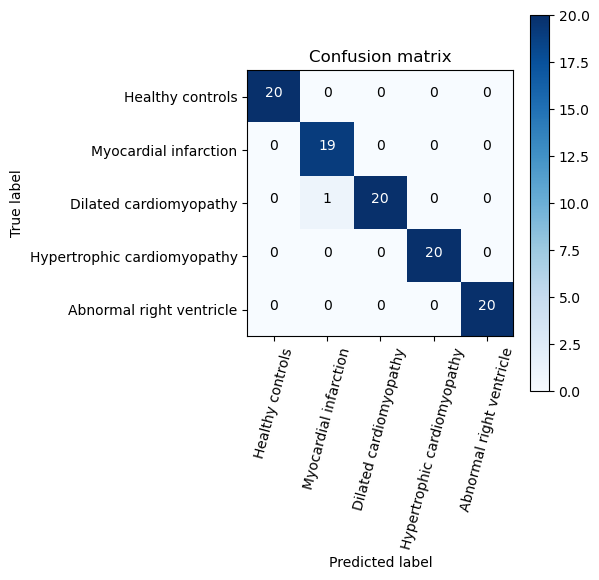

In [43]:
# Confusion matrix
cnf_matrix = confusion_matrix(grid_RF.predict(X_std), y)
plt.figure(figsize=(6,6))
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix')
plt.show()

# VI - Final results and submission

### Test data features

In [44]:
n = len(test_data)

height = np.array([test_data[k]["height"] for k in range(n)])
weight = np.array([test_data[k]["weight"] for k in range(n)])
BSA = body_surface_area(height, weight)


left_Vd = np.array([volume(test_data[k]["seg_d"], 
                           left_ventricule_mask, 
                           test_data[k]["scale_xy"], 
                           test_data[k]["scale_z"]) for k in range(n)])/BSA

left_Vs = np.array([volume(test_data[k]["seg_s"], 
                           left_ventricule_mask, 
                           test_data[k]["scale_xy"], 
                           test_data[k]["scale_z"]) for k in range(n)])/BSA

left_ef = ejection_fraction(left_Vd, left_Vs)


right_Vd = np.array([volume(test_data[k]["seg_d"], 
                            right_ventricule_mask, 
                            test_data[k]["scale_xy"], 
                            test_data[k]["scale_z"]) for k in range(n)])/BSA

right_Vs = np.array([volume(test_data[k]["seg_s"], 
                            right_ventricule_mask, 
                            test_data[k]["scale_xy"], 
                            test_data[k]["scale_z"]) for k in range(n)])/BSA

right_ef = ejection_fraction(right_Vd, right_Vs)


myo_Vd = np.array([volume(test_data[k]["seg_d"], 
                          myocardium_mask, 
                          test_data[k]["scale_xy"], 
                          test_data[k]["scale_z"]) for k in range(n)])/BSA

myo_Vs = np.array([volume(test_data[k]["seg_s"], 
                          myocardium_mask, 
                          test_data[k]["scale_xy"], 
                          test_data[k]["scale_z"]) for k in range(n)])/BSA


ratio_RL_d = right_Vd/left_Vd
ratio_RL_s = right_Vs/left_Vs
ratio_ML_d = myo_Vd/left_Vd
ratio_ML_s = myo_Vs/left_Vs

In [45]:
X_test = pd.DataFrame({"LV Volume at ED": left_Vd,
                         "LV Volume at ES": left_Vs,
                         "RV Volume at ED": right_Vd,
                         "RV Volume at ES": right_Vs,
                         "MYO Volume at ED": myo_Vd,
                         "MYO Volume at ES": myo_Vs,
                         "LV Ejection Fraction": left_ef,
                         "RV Ejection Fraction": right_ef,
                         "RV and LV Volumes ratio at ED": ratio_RL_d,
                         "RV and LV Volumes ratio at ES": ratio_RL_s,
                         "MYO and LV Volumes ratio at ED": ratio_ML_d,
                         "MYO and LV Volumes ratio at ES": ratio_ML_s,})

X_test.head()

,LV Volume at ED,LV Volume at ES,RV Volume at ED,RV Volume at ES,MYO Volume at ED,MYO Volume at ES,LV Ejection Fraction,RV Ejection Fraction,RV and LV Volumes ratio at ED,RV and LV Volumes ratio at ES,MYO and LV Volumes ratio at ED,MYO and LV Volumes ratio at ES
0,140577.530789,98212.445056,72445.112886,42922.879090,77628.509695,75778.268315,0.301365,0.407512,0.515339,0.437041,0.552211,0.771575
1,64123.066639,28739.317360,146902.126044,85628.427621,36832.996907,37520.775442,0.551810,0.417106,2.290940,2.979487,0.574411,1.305556
2,56683.576579,18854.097637,77864.115503,42658.774126,51424.275659,57852.310117,0.667380,0.452138,1.373663,2.262573,0.907216,3.068421
3,54079.955383,9972.190354,74061.755192,27624.651141,59870.561226,71741.770945,0.815603,0.627005,1.369486,2.770169,1.107075,7.194184
4,68736.381393,28678.780844,125574.544710,94530.503590,54137.291785,60977.368799,0.582771,0.247216,1.826901,3.296183,0.787608,2.126219


In [46]:
X_test_std = scaler.transform(X_test)

In [48]:
model = RandomForestClassifier(max_features=1,n_estimators=10, min_samples_split=4, random_state=0)
model.fit(X_std, y)

submission = pd.read_csv('SampleSubmission.csv')
submission['Category'] = model.predict(X_test_std)
submission.to_csv('submission_rf.csv', index=False)